# Capstone Project - The Battle of the Neighborhoods Week1

<h1><center><i>New York Restaurant Data Project</i></center></h1>
 <img src="https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcQnPzjRkhYvaXAP3eXKUrmGaw5xCKEWJYnWGS-JrVR_q1GmGcd1&usqp=CAU" alt="Restaurant" width="500" height="600"/> 
<h3><center><i>for</i></h3>
    <h2><center><em>ABC Multicuisine Inc</em></center></h2>

## Table of Contents

<div class="alert alert-block alert-info" style="margin-top: 20px">

<font size = 3>

1. [Introduction: Business Problem](#introduction)
2. [Problem Background](#problembackground)
3. [Problem Description](#problemdescription)
4. [Target Audience / Stakeholders](#targetaudience)
5. [Success / Exit Criteria](#success)
6. [Dataset / Data Provider](#dataset)
    1. [Zipcode Definition Data](#zipcode)
    2. [Population Density by Boroughs Data](#density)
    3. [Population By Zipcodes for all Boroughs](#population)
    4. [Foursquare Venues Data By Restaurant Category](#foursquare)
    5. [Known Assumptions](#assumptions)
7. [Methodology](#methodology)
8. [Examine Neighborhood Clusters](#examine)
    1. [Neighborhoods where American Restaurant is most common](#american)
    2. [Neighborhoods where Italian Restaurant is most common](#italian)
    3. [Neighborhoods where Chinese Restaurant is most common](#chinese)
    4. [Neighborhoods where Indian Restaurant is most common](#indian)
9.  [Similarities / Dissimilarities between Boroughs in New York](#similar)
10. [Cluster Neighborhoods](#clustering)
11. [Results](#results)
12. [Discussion](#discussion)
13. [Conclusion](#conclusion)
</font>
</div>

## 1. Introduction: Business Problem <a name="introduction"></a>
### Introduction

**ABC Multicuisine Inc** (hear after will be referred as the Company) is a successfully run food restaurant company that specialized in **Indian**, **Chinese**, **American** and **Italian** cuisine. The Company is interested in exploring a suitable opportunity to start a new restaurant in **New York** area by the end of Q3 of 2020. 

## 2. Problem Background <a name="problembackground"></a>

The Company has been successfully running their restaurant business in Asia and Australia region and would like to enter the United States market by setting up their first restaurant in **New York** region and then expand further in other parts of New York and other cities in USA. As the company is a new entrant to this part of the world, they have engaged the data science team to research, study and come up with recommendation on which area in New York would be best suited to open their first restaurant specialzing in one among their core strength of **Indian**, **Chinese**, **American** and **Italian** cuisine.

The **New York** city is the financial capitol of the USA with diversified population. Its one of the highest populated city in the USA with several industries ranging from Finance, Sofware, Retail, Consumer, Tourism and so on. The Company would like to make the decision by Q3 of 2020 and looks forward to the datascience team to do a through analysis and come up with the recommendation in terms of the best location and best cuisine for the new restaurant that can help them gain market share, establish their brand vaules in New York and help them achieve their best return on investment.

## 3. Problem Description <a name="problemdescription"></a>

The City of New York serves variety of international cuisine food to their customers. As our company specializes and interested only in **Indian**, **Chinese**, **American** and **Italian**, we will be focusing only on these four kind of foods for our data analysis. The New York city is divided into five [Boroughs](https://en.wikipedia.org/wiki/Borough) namely: 
* Bronx
* Brooklyn
* Manhattan
* Queens
* Staten Island

In order to compete with the existing players and gain market share for our Company and help them grow organically, as part of our data science project, We will be analyzing and taking into account the following areas with respect to each of the above mentioned Boroughs:

* List of zip codes mapped to Boroughs
* Land Area of Boroughs
* Per Capita Income of People in Each Boroughs
* Persons Per Square Miles
* Total Population and Population of different Ethinic groups
* Existing Players per cuisine in the market segment of each Boroughs
* Compare Similarities and Dissimilarities between all five Boroughs

In short, As this will be the first project of the Company in this part of the world, its very important that we come with the right recommendation in terms of the best location within the five Boroughs in New York and the best restaurant cuisine type within the four categoies the Company specializes in that helps them gain market share and get better return on investment.

## 4. Target Audience / Stakeholders <a name="targetaudience"></a>

**ABC Multicuisine Inc** has chosen our datascience team understand, study and analyze their problem of finding the right location within New York to start their first restaurant in USA region. Our objective is to come with the best possible recommendation based on the available data and our research and submit the report to the Board of Directors, Business Head of USA region and their Executive Leadership team.

## 5. Success / Exit Criteria <a name="success"></a>

The success criteria for the outcome of this data science project will be decided by the best location and the best category of cuisine recommendation provided by the team that caters the needs of the local population within that selected Borough and meets the demands of the Company's future customer segment. 

## 6. Dataset / Data Provider <a name="dataset"></a>

The following Data sets will be utilized for this project:

* [New York Neighborhood Data](https://data.beta.nyc/dataset/pediacities-nyc-neighborhoods/resource/7caac650-d082-4aea-9f9b-3681d568e8a5)
* [Land Area / Population Denisty by Boroughs](https://en.wikipedia.org/wiki/Boroughs_of_New_York_City)
* [Population By Zipcodes for all Boroughs](https://data.beta.nyc/dataset/pediacities-nyc-neighborhoods/resource/7caac650-d082-4aea-9f9b-3681d568e8a5)
* [FourSquare Restaurant Categories Data](https://developer.foursquare.com/docs/api-reference/venues/categories/)

### Zipcode Definition Data <a name="zipcode"></a>

The mapping of available New York zipcodes and their correspoding Boroughs can be obtained from: [here](https://data.beta.nyc/dataset/pediacities-nyc-neighborhoods/resource/7caac650-d082-4aea-9f9b-3681d568e8a5)
The New York city has been divided into five Boroughs namely: 
* Bronx
* Brooklyn
* Manhattan
* Queens
* Staten Island

We will get all the zipcodes that are mapped to their corresponding Boroughs and Neighborhood along with their location coordinates of Latitudes and Longitudes.

In [82]:
!pip install folium
!pip install geopy
!pip install bs4
!pip install folium
!pip install shapely

In [83]:
import pandas as pd
import numpy as np
import requests
from bs4 import BeautifulSoup
from sklearn.cluster import KMeans
from geopy.geocoders import Nominatim 
import seaborn as sns
import folium 
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib as mpl
import matplotlib.pyplot as plt
from itertools import cycle, islice
from re import sub
from config import credentials
import pprint
from geopy.distance import lonlat, geodesic, great_circle, distance
from functools import partial
import pyproj
from shapely.ops import transform
from shapely.geometry import Point

%matplotlib inline 
mpl.style.use(['ggplot'])

#### Build New York Neighborhood dataframe from [New York Neighborhood Data](https://data.beta.nyc/dataset/pediacities-nyc-neighborhoods/resource/7caac650-d082-4aea-9f9b-3681d568e8a5)

In [84]:
def get_coordinates_for_zipcode(zipcode):
    address = 'New York, NY {}'.format(zipcode)
    geolocator = Nominatim(user_agent="newyork_explorer")
    location = geolocator.geocode(address)
    latitude = location.latitude
    longitude = location.longitude
    return (latitude, longitude)

def get_coordinates_for_neighborhood(neighborhood):
    address = '{}, New York, NY'.format(neighborhood)
    geolocator = Nominatim(user_agent="newyork_explorer")
    location = geolocator.geocode(address)
    latitude = location.latitude
    longitude = location.longitude
    return (latitude, longitude)

def get_address_for_coordinates(latitude, longitude):
    try:
        geolocator = Nominatim(user_agent="newyork_explorer")
        location = geolocator.reverse("{}, {}".format(latitude, longitude))
        return (location.address)
    except:
        return None

(lat,long) = get_coordinates_for_zipcode(10001)
address = get_address_for_coordinates(lat, long)
print(address)

(lat,long) = get_coordinates_for_zipcode('Chelsea and Clinton')
address = get_address_for_coordinates(lat, long)
print("address for neighborhood:", address)

(lat,long) = get_coordinates_for_zipcode('350 5th Avenue')
address = get_address_for_coordinates(lat, long)
print("address for LI:", address)

725, Mount Avenue, ny, Suffolk County, New York, 11704, United States of America
address for neighborhood: Clinton Gourmet Market, 648, 9th Avenue, Columbus Circle, Manhattan, Manhattan Community Board 4, New York County, New York, 100036, United States of America
address for LI: Empire State Building, 350, 5th Avenue, Midtown South, Manhattan, Manhattan Community Board 5, New York County, New York, 10018, United States of America


In [85]:
new_df = pd.read_csv("nyc_zip_borough_neighborhoods_pop.csv")
new_df['Borough'] = new_df['Borough'].astype(str)
new_df['Neighborhood'] = new_df['Neighborhood'].astype(str)
new_df[['Latitude', 'Longitude']] = new_df.apply(lambda row: get_coordinates_for_zipcode(row.ZipCode), axis=1).apply(pd.Series)
new_df.head()

,ZipCode,Borough,Neighborhood,Population,Density,Latitude,Longitude
0,10001,Manhattan,Chelsea and Clinton,21102,33959,40.741236,-73.356691
1,10002,Manhattan,Lower East Side,81410,92573,40.712728,-74.006015
2,10003,Manhattan,Lower East Side,56024,97188,40.712728,-74.006015
3,10004,Manhattan,Lower Manhattan,3089,5519,40.712728,-74.006015
4,10005,Manhattan,Lower Manhattan,7135,97048,40.712728,-74.006015


In [86]:
print(new_df.shape)
unique_neighborhoods = new_df.groupby(by='Borough')['Neighborhood'].unique()
print(unique_neighborhoods)
print(unique_neighborhoods.loc['Manhattan'])
len(new_df['Neighborhood'].unique())

(177, 7)
Borough
Bronx            [High Bridge and Morrisania, Central Bronx, Hu...
Brooklyn         [Northwest Brooklyn, Flatbush, Borough Park, B...
Manhattan        [Chelsea and Clinton, Lower East Side, Lower M...
Queens           [Southeast Queens, Northwest Queens, Long Isla...
Staten Island    [Stapleton and St. George, Port Richmond, Sout...
Name: Neighborhood, dtype: object
['Chelsea and Clinton' 'Lower East Side' 'Lower Manhattan'
 'Gramercy Park and Murray Hill' 'Greenwich Village and Soho'
 'Upper East Side' 'Upper West Side' 'Central Harlem' 'East Harlem'
 'Inwood and Washington Heights' 'West Side' 'Tribeca']


45

In [87]:
restaurant_categories = {
    "Indian": "4bf58dd8d48988d10f941735",
    "Chinese": "4bf58dd8d48988d145941735",
    "Italian": "4bf58dd8d48988d110941735",
    "American": "4bf58dd8d48988d14e941735"
}
l = []
for category in restaurant_categories:
    for neighborhood in new_df['Neighborhood'].unique():
        l.append((category, neighborhood))

In [88]:
# Load Neighborhood data from csv file when the geopy geocode api fails
#new_df = new_df = pd.read_csv("with_location_nyc_zip_borough_neighborhoods_pop.csv")
#new_df['Borough'] = new_df['Borough'].astype(str)
#new_df['Neighborhood'] = new_df['Neighborhood'].astype(str)
#new_df.head()

### Land Area / Population Denisty by Boroughs<a name="density"></a>

The following key data for each Boroughs can be obtained from [here](https://en.wikipedia.org/wiki/Boroughs_of_New_York_City)
* Per Capita Income 
* Land Area
* People Living Per Square Miles 

[Per Capita Income](https://en.wikipedia.org/wiki/Per_capita_income) data measures the **average income earned per person** in a given area. It is calculated by dividing the area's total income by its total population. [Population density](https://en.wikipedia.org/wiki/Population_density) is a measurement of population per unit area, or exceptionally unit volume; it is a quantity of type number density.

In [89]:
# Process the data from the Boroughs wikipedia page
url = 'https://en.wikipedia.org/wiki/Boroughs_of_New_York_City'
source = requests.get(url).text
soup = BeautifulSoup(source, 'html')
table=soup.find('table')

# Create the dataframe and populate the data
column_names=['Borough', 'PerCapitaIncome', 'LandArea', 'PersonsPerSqM']
borough_df = pd.DataFrame(columns=column_names)
for tr in table.find_all('tr'):
    row_data=[]
    for td in tr.find_all('td'):
        row_data.append(td.text.strip())
        if len(row_data) == 9:
            #print(row_data)
            borough_df.loc[len(borough_df)] = [row_data[0], 
                                               int(sub(r'[^\d.]', '', row_data[4])), 
                                               float(sub(r'[^\d.]', '', row_data[5])), 
                                               int(sub(r'[^\d.]', '', row_data[7]))]
# Data cleanup
borough_df.loc[borough_df['Borough'] == 'The Bronx', 'Borough'] = 'Bronx'
borough_df['PerCapitaIncome'] = borough_df['PerCapitaIncome'].astype(int)
borough_df['PersonsPerSqM'] = borough_df['PersonsPerSqM'].astype(int)
borough_df

,Borough,PerCapitaIncome,LandArea,PersonsPerSqM
0,Bronx,30100,42.10,33867
1,Brooklyn,35800,70.82,36147
2,Manhattan,368500,22.83,71341
3,Queens,41400,108.53,20767
4,Staten Island,30500,58.37,8157


### Population data By Zipcodes for All Boroughs <a name="population"></a>

We will collect the following category of data from [here](https://data.beta.nyc/dataset/pediacities-nyc-neighborhoods/resource/7caac650-d082-4aea-9f9b-3681d568e8a5)
* Population  (Number of people living in a given zip code area)
* Density (Number of people living per square mile in a given zip code area)

Population and density will provide as a clear picture of how densely each zip code areas are populated.

### Foursquare Venues Data By Restaurant Category<a name="foursquare"></a>

[Forsquare.com](https://foursquare.com/) provides access to firmographic data and rich community-sourced content for more than 60 million commercial places around the world—via flat file or API. We will be useing their [Places API](https://developer.foursquare.com/docs/build-with-foursquare/categories/) that provides location data with the list of restaurant venues for a given restaurant category and Borough in [JSON](https://en.wikipedia.org/wiki/JSON) format. Since, ABC Multicusine Inc specializes only in certain kind of cusines, We be collecting the restaurant data for the following four categories of restaurants:
* **American**
* **Italian**
* **Chinese**
* **Indian**

In [90]:
restaurant_categories = {
    "Indian": "4bf58dd8d48988d10f941735",
    "Chinese": "4bf58dd8d48988d145941735",
    "Italian": "4bf58dd8d48988d110941735",
    "American": "4bf58dd8d48988d14e941735"
}

def get_restaurants_by_category_id(category_id, neighborhood, version='20190425'):
    restaurants_list = []
    url = "https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&v={}&intent=browse&near={}, NY" \
    "&categoryId={}".format(credentials["CLIENT_ID"], credentials["CLIENT_SECRET"], version, borough, category_id)
    venues = None
    response = requests.request("GET", url, headers={}, data={})
    response = response.json()
    if response["meta"]["code"] == 200:
        venues = response["response"]["venues"]
    else:
        print("neighborhood: return code:", response["meta"]["code"])
        venues = None
    return venues

# Create an Empty Data Frame
restaurant_columns =['ZipCode', 'Borough', 'Neighborhood', 'Latitude', 'Longitude', 'Name', 'Category']
restaurants_df = pd.DataFrame(columns=restaurant_columns)

# Get the restaurant details for each of the category and Neighborhood: Indian, Chinese, American and Italian
for category in restaurant_categories:
    for neighborhood in new_df['Neighborhood'].unique():
        borough = np.array_str(new_df.loc[new_df['Neighborhood'] == neighborhood, 'Borough'].unique())[1:-1]
        borough = borough[1:-1]
        venues = get_restaurants_by_category_id(restaurant_categories[category], neighborhood)
            
        if venues is not None:
            for venue in venues:
                if "postalCode" in venue["location"]:
                    postal_code = venue['location']['postalCode']
                else:
                    postal_code = new_df.loc[new_df['Neighborhood'] == neighborhood, 'ZipCode'].unique()[0]
                restaurants_df.loc[len(restaurants_df)] = [postal_code, borough, neighborhood, venue['location']['lat'],venue['location']['lng'], 
                                                           venue['name'], venue['categories'][0]['shortName']]
        else:
            print("No restaurants found for neighborhood:", neighborhood)

print('shape:', restaurants_df.shape)
restaurants_df.head()

shape: (5321, 7)


,ZipCode,Borough,Neighborhood,Latitude,Longitude,Name,Category
0,10009,Manhattan,Chelsea and Clinton,40.727510,-73.979324,Khiladi NYC,South Indian
1,10024,Manhattan,Chelsea and Clinton,40.786166,-73.976414,Alachi Masala,Indian
2,10022,Manhattan,Chelsea and Clinton,40.755620,-73.968666,Amma,Indian
3,10009,Manhattan,Chelsea and Clinton,40.727285,-73.979602,Desi Galli - Avenue B,Chaat
4,10016,Manhattan,Chelsea and Clinton,40.741393,-73.983367,Saravanaa Bhavan,South Indian


In [91]:
restaurants_df.to_csv("unaltered_data.csv", index=False)

In [92]:
# Data Cleaning
restaurants_df.replace(to_replace=['South Indian', 'Chaat', 'North Indian', 'Farm',
                                   'Indian Chinese', 'Coffee Shop', 'Food Court', 'Tibetan', 'Halal'], value='Indian', inplace=True)

restaurants_df.replace(to_replace=['Dim Sum', 'Cantonese', 'Shanghai', 'Taiwanese', 'Asian', 'Cha Chaan Teng', 'Bubble Tea', 'Szechuan', 'Restaurant'
                                   'Bakery', 'Vegetarian / Vegan', 'Seafood', 'Fried Chicken', 'Hotpot', 'Theme Restaurant',
                                   'Dumplings'], value='Chinese', inplace=True)

restaurants_df.replace(to_replace=['Gourmet', 'Pizza', 'Café', 'Cocktail', 'Sandwiches', 'Fast Food', 
                                   'Deli / Bodega', 'Food & Drink'], value='Italian', inplace=True)

restaurants_df.replace(to_replace=['New American', 'Southern / Soul', 'Beer Garden', 'Burgers', 'Bar', 'Bagels', 'Wine Bar','Diner', 'Sports Bar', 
                                   'BBQ','Pub','Tex-Mex', 'Ice Cream', 'Gastropub', 'Breakfast', 'Nightlife', 'Steakhouse'], 
                                   value='American', inplace=True)

restaurants_df.replace(to_replace=['Bakery', 'Restaurant'], value='Chinese', inplace=True)
restaurants_df.replace(to_replace=['New.', 'Beer Garden'], value='American', regex=True, inplace=True)
restaurants_df.replace(to_replace=['AmericanAmerican'], value='American', inplace=True)
restaurants_df.replace(to_replace=[' Wine Bar'], value='American', inplace=True)

drop_indexes = restaurants_df[(restaurants_df.Category != 'Indian') & (restaurants_df.Category != 'Chinese') & 
                               (restaurants_df.Category != 'American') & (restaurants_df.Category != 'Italian')].index

restaurants_df.drop(drop_indexes, inplace=True)
restaurants_df['ZipCode'] = restaurants_df['ZipCode'].astype(int)

print(restaurants_df.shape)
restaurants_df.tail()

(5233, 7)


,ZipCode,Borough,Neighborhood,Latitude,Longitude,Name,Category
5315,11106,Queens,Rockaways,40.762151,-73.925664,Sanfords,American
5316,11697,Queens,Rockaways,40.561360,-73.920932,Kennedy's,American
5317,11374,Queens,Rockaways,40.729185,-73.859349,the dinerbar,American
5318,11691,Queens,Rockaways,40.757750,-73.846455,Hot Pastrami Stand,American
5320,11102,Queens,Rockaways,40.771690,-73.926431,Zeus Kitchen,American


#### Known assumptions<a name="assumptions">
This project is done with the known api rate limiting imposed by foursquare. 

In [93]:
restaurants_df.to_csv("restaurants_data.csv")
print("Save the data into restaurants_data.csv file!")

Save the data into restaurants_data.csv file!


In [94]:
# Backup: Load previously queried data from csv file if the Foursquare apis fail
# restaurants_df = pd.read_csv("restaurants_data.csv")
# print(restaurants_df.shape)
# restaurants_df.head()

### 7. Methodology <a name="methodology"></a>

### Business Understanding

Our primay aim is to suggest the best possible location from the available neighborhood data that helps **ABC Multicuisine Inc** to start their first restaurant in New York region.


In [95]:
restaurants_df.groupby('Neighborhood').count()

,ZipCode,Borough,Latitude,Longitude,Name,Category
Neighborhood,,,,,,
Borough Park,117,117,117,117,117,117
Bronx Park and Fordham,116,116,116,116,116,116
Bushwick and Williamsburg,117,117,117,117,117,117
Canarsie and Flatlands,117,117,117,117,117,117
Central Bronx,116,116,116,116,116,116
Central Brooklyn,117,117,117,117,117,117
Central Harlem,119,119,119,119,119,119
Central Queens,118,118,118,118,118,118
Chelsea and Clinton,119,119,119,119,119,119


In [96]:
# one hot encoding
restaurants_onehot = pd.get_dummies(restaurants_df[['Category']], prefix="", prefix_sep="")

# add zipcode column back to dataframe
restaurants_onehot['Neighborhood'] = restaurants_df['Neighborhood'] 

# move zipcode column to the first column
fixed_columns = [restaurants_onehot.columns[-1]] + list(restaurants_onehot.columns[:-1])
restaurants_onehot = restaurants_onehot[fixed_columns]

#### Next, let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category

In [97]:
restaurants_grouped = restaurants_onehot.groupby('Neighborhood').mean().reset_index()
print(restaurants_grouped.shape)
restaurants_grouped.tail()

(45, 5)


,Neighborhood,American,Chinese,Indian,Italian
40,Upper East Side,0.193277,0.260504,0.252101,0.294118
41,Upper West Side,0.193277,0.260504,0.252101,0.294118
42,West Central Queens,0.211864,0.245763,0.254237,0.288136
43,West Queens,0.211864,0.245763,0.254237,0.288136
44,West Side,0.193277,0.260504,0.252101,0.294118


#### Get the Top 4 Restarunt Category Per Neighborhood

In [98]:
num_top_venues = 4

for hood in restaurants_grouped['Neighborhood'][:5]:
    print("----hood: {}----".format(hood))
    temp = restaurants_grouped[restaurants_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----hood: Borough Park----
      venue  freq
0   Chinese  0.27
1   Italian  0.26
2  American  0.23
3    Indian  0.23


----hood: Bronx Park and Fordham----
      venue  freq
0   Chinese  0.28
1   Italian  0.27
2    Indian  0.23
3  American  0.22


----hood: Bushwick and Williamsburg----
      venue  freq
0   Chinese  0.27
1   Italian  0.26
2  American  0.23
3    Indian  0.23


----hood: Canarsie and Flatlands----
      venue  freq
0   Chinese  0.27
1   Italian  0.26
2  American  0.23
3    Indian  0.23


----hood: Central Bronx----
      venue  freq
0   Chinese  0.28
1   Italian  0.27
2    Indian  0.23
3  American  0.22




#### Rank the most common restaurant category for reach Neighborhood area
This analyzis will help identy the most common restaurant category for a given neighborhood.

#### function to sort the venues in descending order.

In [99]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

#### Now let's create the new dataframe and display the top 4 category of restaurant for each neighborhood.

In [100]:
num_top_venues = 4

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
restaurants_venues_sorted = pd.DataFrame(columns=columns)
restaurants_venues_sorted['Neighborhood'] = restaurants_grouped['Neighborhood']

for ind in np.arange(restaurants_grouped.shape[0]):
    restaurants_venues_sorted.iloc[ind, 1:] = return_most_common_venues(restaurants_grouped.iloc[ind, :], num_top_venues)

print(restaurants_venues_sorted.shape)
restaurants_venues_sorted.head()

(45, 5)


,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue
0,Borough Park,Chinese,Italian,Indian,American
1,Bronx Park and Fordham,Chinese,Italian,Indian,American
2,Bushwick and Williamsburg,Chinese,Italian,Indian,American
3,Canarsie and Flatlands,Chinese,Italian,Indian,American
4,Central Bronx,Chinese,Italian,Indian,American


In [101]:
restaurants_merged = new_df

# merge restaurants_venue_sorted with borough data to add latitude/longitude for each neighborhood
restaurants_merged = restaurants_merged.join(restaurants_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

#pd.options.display.max_rows = 999

print(restaurants_merged.shape)
restaurants_merged.head()

(177, 11)


,ZipCode,Borough,Neighborhood,Population,Density,Latitude,Longitude,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue
0,10001,Manhattan,Chelsea and Clinton,21102,33959,40.741236,-73.356691,Italian,Chinese,Indian,American
1,10002,Manhattan,Lower East Side,81410,92573,40.712728,-74.006015,Italian,Chinese,Indian,American
2,10003,Manhattan,Lower East Side,56024,97188,40.712728,-74.006015,Italian,Chinese,Indian,American
3,10004,Manhattan,Lower Manhattan,3089,5519,40.712728,-74.006015,Italian,Chinese,Indian,American
4,10005,Manhattan,Lower Manhattan,7135,97048,40.712728,-74.006015,Italian,Chinese,Indian,American


In [102]:
restaurants_df.head()

,ZipCode,Borough,Neighborhood,Latitude,Longitude,Name,Category
0,10009,Manhattan,Chelsea and Clinton,40.727510,-73.979324,Khiladi NYC,Indian
1,10024,Manhattan,Chelsea and Clinton,40.786166,-73.976414,Alachi Masala,Indian
2,10022,Manhattan,Chelsea and Clinton,40.755620,-73.968666,Amma,Indian
3,10009,Manhattan,Chelsea and Clinton,40.727285,-73.979602,Desi Galli - Avenue B,Indian
4,10016,Manhattan,Chelsea and Clinton,40.741393,-73.983367,Saravanaa Bhavan,Indian


### 8. Examine Neighborhood Clusters <a name="examine">

#### Neighborhoods where American Restaurants are most common<a name="american">

In [103]:
american_category = restaurants_df.loc[restaurants_df['Category'] == 'American']
american_category.sort_values(by='Borough')
american_food_zipcodes = {"Bronx": [], "Brooklyn": [], "Manhattan": [], "Queens": [],  "Staten Island": []}

# create map
nyc_geo = r'nycboroughboundaries.geojson' # geojson file
map_clusters = folium.Map(location=[40.730610, -73.935242], zoom_start=10)

# generate choropleth map using the total immigration of each country to Canada from 1980 to 2013
map_clusters.choropleth(
    geo_data=nyc_geo,
    key_on='feature.properties.name',
    fill_color="Greys", 
    fill_opacity=0.3, 
    line_opacity=0.2
)

for lat, lon, poi,borough in zip(american_category['Latitude'], american_category['Longitude'], american_category['ZipCode'], 
                         american_category['Borough']):
    try:
        population = new_df.loc[new_df.ZipCode == poi].Population.item()
        density = new_df.loc[new_df.ZipCode == poi].Density.item()
        per_capita_income = borough_df[borough_df.Borough == borough].PerCapitaIncome.item()
        popup_text = "Borough: {}<br/>PerCapita: ${}<br/>Zipcode: {}<br/>Category: American<br/>Population: {}<br/>Density: {}<br/>".format(borough,
                                                                                            str(per_capita_income),str(poi),population, density)
    except:
        popup_text = "Borough: {}<br/>PerCapita: ${}<br/>Zipcode: {}<br/>Category: American<br/>".format(borough, str(per_capita_income), str(poi))
        
    popup = folium.Popup(popup_text, parse_html=False)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=popup,
        color='#b22234',
        fill=True,
        fill_color='#3c3b6e',
        fill_opacity=0.7).add_to(map_clusters)

title_html = '''
             <h3 align="center" style="font-size:20px"><b>American Category Restaurants in New York Boroughs</b></h3>
             '''
map_clusters.get_root().html.add_child(folium.Element(title_html))
map_clusters

#### Neighborhoods where Italian Restaurants are most common<a name="italian">

In [104]:
italian_category = restaurants_df.loc[restaurants_df['Category'] == 'Italian']
italian_category.sort_values(by='Borough')
italian_food_zipcodes = {"Bronx": [], "Brooklyn": [], "Manhattan": [], "Queens": [],  "Staten Island": []}

# create map
nyc_geo = r'nycboroughboundaries.geojson' # geojson file
map_clusters = folium.Map(location=[40.730610, -73.935242], zoom_start=10)

# generate choropleth map using the total immigration of each country to Canada from 1980 to 2013
map_clusters.choropleth(
    geo_data=nyc_geo,
    key_on='feature.properties.name',
    fill_color="Greys", 
    fill_opacity=0.3, 
    line_opacity=0.2
)

for lat, lon, poi,borough in zip(italian_category['Latitude'], italian_category['Longitude'], italian_category['ZipCode'], 
                         italian_category['Borough']):
    try:
        population = new_df.loc[new_df.ZipCode == poi].Population.item()
        density = new_df.loc[new_df.ZipCode == poi].Density.item()
        per_capita_income = borough_df[borough_df.Borough == borough].PerCapitaIncome.item()
        popup_text = "Borough: {}<br/>PerCapita: ${}<br/>Zipcode: {}<br/>Category: Italian<br/>Population: {}<br/>Density: {}<br/>".format(borough,
                                                                                            str(per_capita_income),str(poi),population, density)
    except:
        popup_text = "Borough: {}<br/>PerCapita: ${}<br/>Zipcode: {}<br/>Category: Italian<br/>".format(borough, str(per_capita_income), str(poi))
        
    popup = folium.Popup(popup_text, parse_html=False)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=popup,
        color='#008c45',
        fill=True,
        fill_color='#cd212a',
        fill_opacity=0.7).add_to(map_clusters)

title_html = '''
             <h3 align="center" style="font-size:20px"><b>Italian Category Restaurants in New York Boroughs</b></h3>
             '''
map_clusters.get_root().html.add_child(folium.Element(title_html))
map_clusters

#### Neighborhoods where Chinese Restaurants are most common<a name="chinese">

In [105]:
chinese_category = restaurants_df.loc[restaurants_df['Category'] == 'Chinese']
chinese_category.sort_values(by='Borough')
chinese_food_zipcodes = {"Bronx": [], "Brooklyn": [], "Manhattan": [], "Queens": [],  "Staten Island": []}

# create map
nyc_geo = r'nycboroughboundaries.geojson' # geojson file
map_clusters = folium.Map(location=[40.730610, -73.935242], zoom_start=10)

# generate choropleth map using the total immigration of each country to Canada from 1980 to 2013
map_clusters.choropleth(
    geo_data=nyc_geo,
    key_on='feature.properties.name',
    fill_color="Greys", 
    fill_opacity=0.3, 
    line_opacity=0.2
)


for lat, lon, poi,borough in zip(chinese_category['Latitude'], chinese_category['Longitude'], chinese_category['ZipCode'], 
                         chinese_category['Borough']):
    try:
        population = new_df.loc[new_df.ZipCode == poi].Population.item()
        density = new_df.loc[new_df.ZipCode == poi].Density.item()
        per_capita_income = borough_df[borough_df.Borough == borough].PerCapitaIncome.item()
        popup_text = "Borough: {}<br/>PerCapita: ${}<br/>Zipcode: {}<br/>Category: Chinese<br/>Population: {}<br/>Density: {}<br/>".format(borough,
                                                                                            str(per_capita_income),str(poi),population, density)
    except:
        popup_text = "Borough: {}<br/>PerCapita: ${}<br/>Zipcode: {}<br/>Category: Chinese<br/>".format(borough, str(per_capita_income), str(poi))
        
    popup = folium.Popup(popup_text, parse_html=False)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=popup,
        color='#FF0000',
        fill=True,
        fill_color='#FFFF00',
        fill_opacity=0.7).add_to(map_clusters)

title_html = '''
             <h3 align="center" style="font-size:20px"><b>Chinese Category Restaurants in New York Boroughs</b></h3>
             '''
map_clusters.get_root().html.add_child(folium.Element(title_html))
map_clusters

#### Neighborhoods where Indian Restaurants are most common<a name="indian">

In [106]:
indian_category = restaurants_df.loc[restaurants_df['Category'] == 'Indian']
indian_category.sort_values(by='Borough')
indian_food_zipcodes = {"Bronx": [], "Brooklyn": [], "Manhattan": [], "Queens": [],  "Staten Island": []}

# create map
nyc_geo = r'nycboroughboundaries.geojson' # geojson file
map_clusters = folium.Map(location=[40.730610, -73.935242], zoom_start=10)

# generate choropleth map using the total immigration of each country to Canada from 1980 to 2013
map_clusters.choropleth(
    geo_data=nyc_geo,
    key_on='feature.properties.name',
    fill_color="Greys", 
    fill_opacity=0.3, 
    line_opacity=0.2
)

for lat, lon, poi,borough in zip(indian_category['Latitude'], indian_category['Longitude'], indian_category['ZipCode'], 
                         indian_category['Borough']):
    
    try:
        population = new_df.loc[new_df.ZipCode == poi].Population.item()
        density = new_df.loc[new_df.ZipCode == poi].Density.item()
        per_capita_income = borough_df[borough_df.Borough == borough].PerCapitaIncome.item()
        popup_text = "Borough: {}<br/>PerCapita: ${}<br/>Zipcode: {}<br/>Category: Indian<br/>Population: {}<br/>Density: {}<br/>".format(borough,
                                                                                            str(per_capita_income),str(poi),population, density)
    except:
        popup_text = "Borough: {}<br/>PerCapita: ${}<br/>Zipcode: {}<br/>Category: Indian<br/>".format(borough, str(per_capita_income), str(poi))
    
    popup = folium.Popup(popup_text, parse_html=False)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=popup,
        color='#000080',
        fill=True,
        fill_color='#FF9933',
        fill_opacity=0.7).add_to(map_clusters)
title_html = '''
             <h3 align="center" style="font-size:20px"><b>Indian Category Restaurants in New York Boroughs</b></h3>
             '''
map_clusters.get_root().html.add_child(folium.Element(title_html))
map_clusters

## 9. Similarities / Dissimilarities between Boroughs in New York<a name="similar">

In this second, we will analyze various data that are specific to each boroughs. We will analyze the following data:
* Per Capita Income of people living in each borough
* Number of people living per square mile area
* Total land area of each borough
* Population number for various ethnic groups.

Text(0, 0.5, 'Total Population')

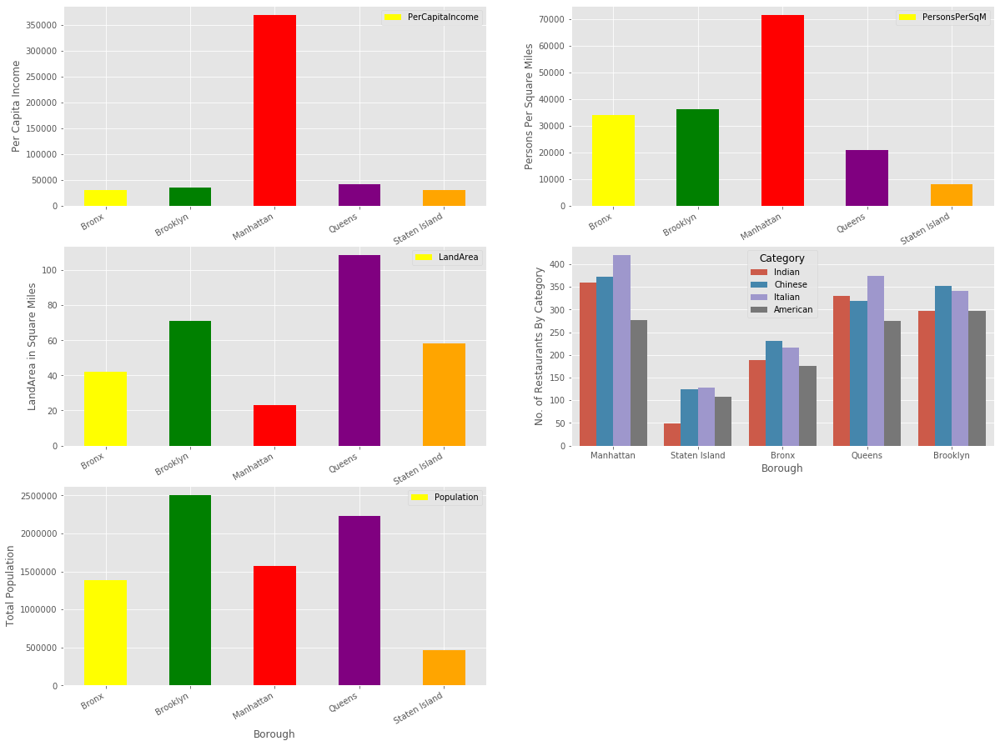

In [107]:
fig, axes = plt.subplots(figsize=(20,15),nrows=3, ncols=2)
fig.delaxes(axes[2][1])

borough_population_agg_df = new_df.groupby('Borough')['Population'].agg(Population=('sum'))

# Add 5 different plots showing similarities and dissimilarities
borough_df[["Borough","PerCapitaIncome"]].plot(ax=axes[0,0], x='Borough', y='PerCapitaIncome', kind='bar', grid=True,
                                               color=['yellow', 'green', 'red', 'purple', 'orange'])
borough_df[["Borough", "PersonsPerSqM"]].plot(ax=axes[0,1], x='Borough', y='PersonsPerSqM',kind='bar',grid=True,
                                              color=['yellow', 'green', 'red', 'purple', 'orange'])
borough_df[["Borough", "LandArea"]].plot(ax=axes[1,0], x='Borough', y='LandArea', kind='bar', grid=True,
                                         color=['yellow', 'green', 'red', 'purple', 'orange'])
sns.countplot(ax=axes[1,1], data=restaurants_df,x='Borough',hue='Category')
borough_population_agg_df.plot(ax=axes[2,0], y='Population', kind='bar', grid=True, color=['yellow', 'green', 'red', 'purple', 'orange'])

# Set labels for the plots
axes[0,0].set_xticklabels(borough_df['Borough'], rotation=30, ha='right')
axes[0,0].set_xlabel('Borough')
axes[0,0].set_ylabel('Per Capita Income')
axes[0,1].set_xticklabels(borough_df['Borough'], rotation=30, ha='right')
axes[0,1].set_xlabel('Borough')
axes[0,1].set_ylabel('Persons Per Square Miles')
axes[1,0].set_xticklabels(borough_df['Borough'], rotation=30, ha='right')
axes[1,0].set_xlabel('Borough')
axes[1,0].set_ylabel('LandArea in Square Miles')
axes[1,1].set_xlabel('Borough')
axes[1,1].set_ylabel('No. of Restaurants By Category')
axes[2,0].set_xticklabels(borough_df['Borough'], rotation=30, ha='right')
axes[2,0].set_xlabel('Borough')
axes[2,0].set_ylabel('Total Population')

## 10. Modeling<a name="modeling">

In [108]:
(target_latitude, target_longitude) = get_coordinates_for_neighborhood("Empire State Building, Manhattan")
print("Empire State Building:", target_latitude, target_longitude)

Empire State Building: 40.748428399999995 -73.98565461987332


function to get all the longitudes, latitudes within a 5 miles radius from a given location coordinates

In [109]:
proj_wgs84 = pyproj.Proj('+proj=longlat +datum=WGS84')

# given a location coordinates, get all the coordinates within 5 miles radius
def geodesic_point_buffer(lat, lon, miles):
    # Azimuthal equidistant projection
    aeqd_proj = '+proj=aeqd +lat_0={lat} +lon_0={lon} +x_0=0 +y_0=0'
    project = partial(
        pyproj.transform,
        pyproj.Proj(aeqd_proj.format(lat=lat, lon=lon)),
        proj_wgs84)
    buf = Point(0, 0).buffer(miles * 1609.34)  # distance in metres
    return transform(project, buf).exterior.coords[:]

# get distance between two coordinates
def get_distance(latitude1, longitude1, latitude2, longitude2):
    d =  distance((latitude1, longitude1), (latitude2, longitude2)).miles
    return round(d, 2)

# Example
b = geodesic_point_buffer(target_latitude, target_longitude, 5.0)

get_distance(target_latitude, target_longitude,target_latitude, target_longitude)

0.0

In [110]:
ny_map = folium.Map(location=[target_latitude, target_longitude], zoom_start=13)
folium.Marker([target_latitude, target_longitude], popup='Target Location').add_to(ny_map)

neighboring_coordinates = geodesic_point_buffer(target_latitude, target_longitude, 1.0)
print(len(neighboring_coordinates))
for lon, lat in neighboring_coordinates:
    #folium.CircleMarker([lat, lon], radius=2, color='blue', fill=True, fill_color='blue', fill_opacity=1).add_to(ny_map) 
    folium.Circle([lat, lon], radius=30, color='blue', fill=False).add_to(ny_map)
    #folium.Marker([lat, lon]).add_to(ny_map)
ny_map

66


In [111]:
restaurants_df.head()

,ZipCode,Borough,Neighborhood,Latitude,Longitude,Name,Category
0,10009,Manhattan,Chelsea and Clinton,40.727510,-73.979324,Khiladi NYC,Indian
1,10024,Manhattan,Chelsea and Clinton,40.786166,-73.976414,Alachi Masala,Indian
2,10022,Manhattan,Chelsea and Clinton,40.755620,-73.968666,Amma,Indian
3,10009,Manhattan,Chelsea and Clinton,40.727285,-73.979602,Desi Galli - Avenue B,Indian
4,10016,Manhattan,Chelsea and Clinton,40.741393,-73.983367,Saravanaa Bhavan,Indian


In [112]:
distance_df = restaurants_df.copy()
distance_df.head()

,ZipCode,Borough,Neighborhood,Latitude,Longitude,Name,Category
0,10009,Manhattan,Chelsea and Clinton,40.727510,-73.979324,Khiladi NYC,Indian
1,10024,Manhattan,Chelsea and Clinton,40.786166,-73.976414,Alachi Masala,Indian
2,10022,Manhattan,Chelsea and Clinton,40.755620,-73.968666,Amma,Indian
3,10009,Manhattan,Chelsea and Clinton,40.727285,-73.979602,Desi Galli - Avenue B,Indian
4,10016,Manhattan,Chelsea and Clinton,40.741393,-73.983367,Saravanaa Bhavan,Indian


compute distance from target location to other restaurant locations

In [113]:
for index, row in distance_df.iterrows():
    distance_df.loc[index, 'DistanceToTarget'] = get_distance(target_latitude, target_longitude, row.Latitude, row.Longitude)

distance_df.head()

,ZipCode,Borough,Neighborhood,Latitude,Longitude,Name,Category,DistanceToTarget
0,10009,Manhattan,Chelsea and Clinton,40.727510,-73.979324,Khiladi NYC,Indian,1.48
1,10024,Manhattan,Chelsea and Clinton,40.786166,-73.976414,Alachi Masala,Indian,2.65
2,10022,Manhattan,Chelsea and Clinton,40.755620,-73.968666,Amma,Indian,1.02
3,10009,Manhattan,Chelsea and Clinton,40.727285,-73.979602,Desi Galli - Avenue B,Indian,1.49
4,10016,Manhattan,Chelsea and Clinton,40.741393,-73.983367,Saravanaa Bhavan,Indian,0.50


In [114]:
#distance_american = distance_df[(distance_df['Category'] == 'American') & (distance_df['DistanceToTarget'] <= 1.0)]
filter_distance_df = distance_df[(distance_df['DistanceToTarget'] <= 5.0)]
filter_distance_df

,ZipCode,Borough,Neighborhood,Latitude,Longitude,Name,Category,DistanceToTarget
0,10009,Manhattan,Chelsea and Clinton,40.727510,-73.979324,Khiladi NYC,Indian,1.48
1,10024,Manhattan,Chelsea and Clinton,40.786166,-73.976414,Alachi Masala,Indian,2.65
2,10022,Manhattan,Chelsea and Clinton,40.755620,-73.968666,Amma,Indian,1.02
3,10009,Manhattan,Chelsea and Clinton,40.727285,-73.979602,Desi Galli - Avenue B,Indian,1.49
4,10016,Manhattan,Chelsea and Clinton,40.741393,-73.983367,Saravanaa Bhavan,Indian,0.50
...,...,...,...,...,...,...,...,...
5306,11105,Queens,Rockaways,40.775256,-73.911586,Mike's Diner,American,4.30
5312,11101,Queens,Rockaways,40.746538,-73.944077,Brooks 1890,Italian,2.19
5313,11106,Queens,Rockaways,40.762275,-73.925722,Broadway Station,American,3.29
5315,11106,Queens,Rockaways,40.762151,-73.925664,Sanfords,American,3.29


In [ ]:
color_dict = {
    "Indian": "#000080",
    "Chinese": "#FF0000",
    "Italian": "#008c45",
    "American": "#b22234"
       
}
fill_color_dict = {
    "Indian": "#FF9933",
    "Chinese": '#FFFF00',
    "Italian": "#cd212a",
    "American": "#3c3b6e"
}
ny_map = folium.Map(location=[target_latitude, target_longitude], zoom_start=12)
folium.Marker([target_latitude, target_longitude], popup='Target Location').add_to(ny_map)

nyc_geo = r'nycboroughboundaries.geojson' # geojson file
# generate choropleth map using the total immigration of each country to Canada from 1980 to 2013
ny_map.choropleth(
    geo_data=nyc_geo,
    key_on='feature.properties.name',
    fill_color="Greys", 
    fill_opacity=0.3, 
    line_opacity=0.2
)

for index, row in filter_distance_df.iterrows():
    try:
        population = new_df.loc[new_df.ZipCode == row.ZipCode].Population.item()
        density = new_df.loc[new_df.ZipCode == row.ZipCode].Density.item()
        per_capita_income = borough_df[borough_df.Borough == row.Borough].PerCapitaIncome.item()
        popup_text = "Borough: {}<br/>PerCapita: ${}<br/>Zipcode: {}<br/>Category: {}<br/>Population: {}<br/>Density: {}<br/>".format(row.Borough,
                                                                        str(per_capita_income),str(row.ZipCode),row.Category,population, density)
    except:
        popup_text = "Borough: {}<br/>PerCapita: ${}<br/>Zipcode: {}<br/>Category: {}<br/>".format(row.Borough, str(per_capita_income), 
                                                                                                   str(row.ZipCode), row.Category)
    
    popup = folium.Popup(popup_text, parse_html=False)
    folium.CircleMarker([row.Latitude, row.Longitude], 
                        radius=5,
                        popup=popup,
                        color=color_dict[row.Category], 
                        fill=True, fill_color=fill_color_dict[row.Category], fill_opacity=0.7).add_to(ny_map)
title_html = '''
             <h3 align="center" style="font-size:20px"><b>Restaurants near the Targeted Neighborhood</b></h3>
             '''
ny_map.get_root().html.add_child(folium.Element(title_html))
ny_map

In [ ]:
# one hot encoding
filter_distance_onehot = pd.get_dummies(filter_distance_df[['Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
filter_distance_onehot['Neighborhood'] = filter_distance_df['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [filter_distance_onehot.columns[-1]] + list(filter_distance_onehot.columns[:-1])
filter_distance_onehot = filter_distance_onehot[fixed_columns]

print(filter_distance_onehot.shape)
filter_distance_onehot.tail()

Next, let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category¶

In [ ]:
filter_distance_grouped = filter_distance_onehot.groupby('Neighborhood').mean().reset_index()
print(filter_distance_grouped.shape)
filter_distance_grouped.head()

Let's put that into a *pandas* dataframe
First, let's write a function to sort the venues in descending order.

In [ ]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [ ]:
num_top_venues = 4

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
filter_distance_venues_sorted = pd.DataFrame(columns=columns)
filter_distance_venues_sorted['Neighborhood'] = filter_distance_grouped['Neighborhood']

for ind in np.arange(filter_distance_grouped.shape[0]):
    filter_distance_venues_sorted.iloc[ind, 1:] = return_most_common_venues(filter_distance_grouped.iloc[ind, :], num_top_venues)

print(filter_distance_venues_sorted.shape)
filter_distance_venues_sorted.head()

## 10. Cluster Neighborhoods<a name="clustering">

Run *k*-means to cluster the neighborhood into 5 clusters.

In [ ]:
# set number of clusters
kclusters = 4

filter_distance_grouped_clustering = filter_distance_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(filter_distance_grouped_clustering)

# check cluster labels generated for each row in the dataframe
print(kmeans.labels_[0:4])
kmeans

Let's create a new dataframe that includes the cluster as well as the top 4 category for each neighborhood.

In [ ]:
# add clustering labels
filter_distance_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

filter_distance_merged = new_df.copy()

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
filter_distance_merged = filter_distance_merged.join(filter_distance_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

filter_distance_merged.fillna(filter_distance_merged['Cluster Labels'].mean(), inplace=True)

#filter_distance_merged.head()
filter_distance_merged

In [ ]:
# create map
map_clusters = folium.Map(location=[target_latitude, target_longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(filter_distance_merged['Latitude'], filter_distance_merged['Longitude'], 
                                  filter_distance_merged['Neighborhood'], filter_distance_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[int(cluster)-1],
        fill=True,
        fill_color=rainbow[int(cluster)-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

## 11. Results<a name="results">

From the restaurant's data, we filtered out the restaurants that are within the **5 miles** radius. For a given target location, we collected the 5 miles radius coordinates and then calculated the distance from the target location to all the restaurants within the 5 miles radius. We then used the clustering algorithm to cluster the data and color coded the different restaurant categories.

For a given neighborhood, We also identified the top most common restaurant within the four categories of restaurants and ranked them. We now have a complete picture of each neighborhood and the most common and least common restaurant types within that neighborhood.

**ABC Multi Cuisine Inc** can utilize this data and decide if it would like to venture into the **most common** or **least common** category of restaurants within the targeted region. The **population data**, **per capita income** and **population density** also assist in selecting the right kind of neighborhood that optimize their return on investment.


## 12. Discussion<a name="discussion">

We can also consider the land area data. Keep in mind the future growth of some of the low population density with higher land area. In the future, depending on the business needs of ABC Multi Cuisine Inc, We can also consider other category of restaurants as the New York city is well diversified


## 13. Conclusion<a name="conclusion">

This data analysis was done with limited data as we were restricted by the rate limiting imposed by four square, the location data provider. Getting an enterprise license can provide an endless number of possibilities with vast amounts of data.

Based on the current analysis, **Manhattan** and **Brooklyn**, the high density areas have the most number of restaurants. These areas have a variety of existing players in the market segment. If the cost is not a constraint, then opening a restaurant in these two boroughs can have a bigger impact as the per capita income in these regions are high compared to other boroughs.

**Queens** with **higher land area** could be a good candidate for **future expansion**. **Bronx** and **Staten Island** boroughs can be considered for **small size restaurants** as the per capita income in these regions are lower than others.
